# Exploratory Data Analysis of ORL Dataset

References:
1. https://www.kaggle.com/code/muhmuqtafinnuha/facedetection-pca-manhanttan

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

### Read the data

In [8]:



datasetFaces = []

for person in range(1,41):
    temp = []
    
    for pose in range(1,11):
        data = plt.imread('/Users/espina/Unsynced/Whitepaper/' + '/data/orl/raw/' + f's{str(person)}/{str(pose)}.pgm')
        temp.append(data)
        
    datasetFaces.append(np.array(temp))

datasetFaces = np.array(datasetFaces)

In [3]:
datasetFaces.shape

(40, 10, 112, 92)

### Visualization of every person and pose of the data

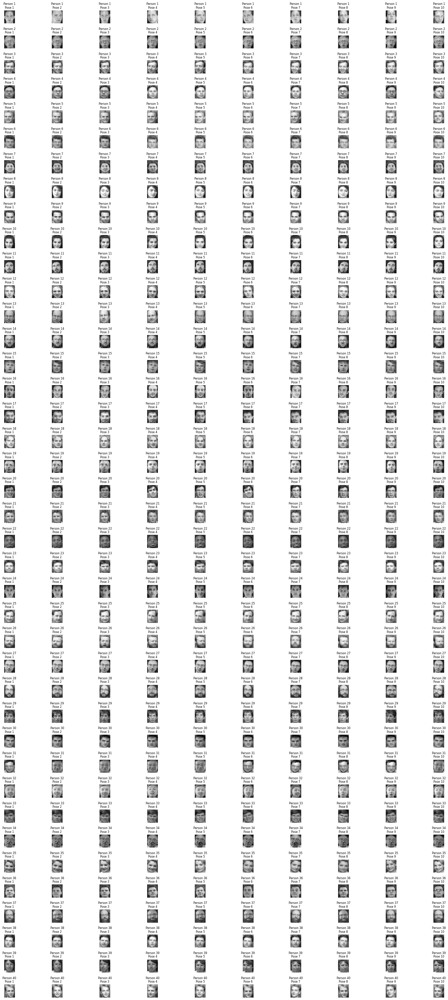

In [4]:
fig, axes = plt.subplots(datasetFaces.shape[0], datasetFaces.shape[1], figsize=(20, 40))

for person in range(datasetFaces.shape[0]):
    for pose in range(datasetFaces.shape[1]):
        axes[person, pose].imshow(datasetFaces[person, pose], cmap='gray')
        axes[person, pose].axis('off')
        axes[person, pose].set_title(f'Person {person + 1}\nPose {pose + 1}', fontsize=8)

plt.tight_layout()
plt.show()

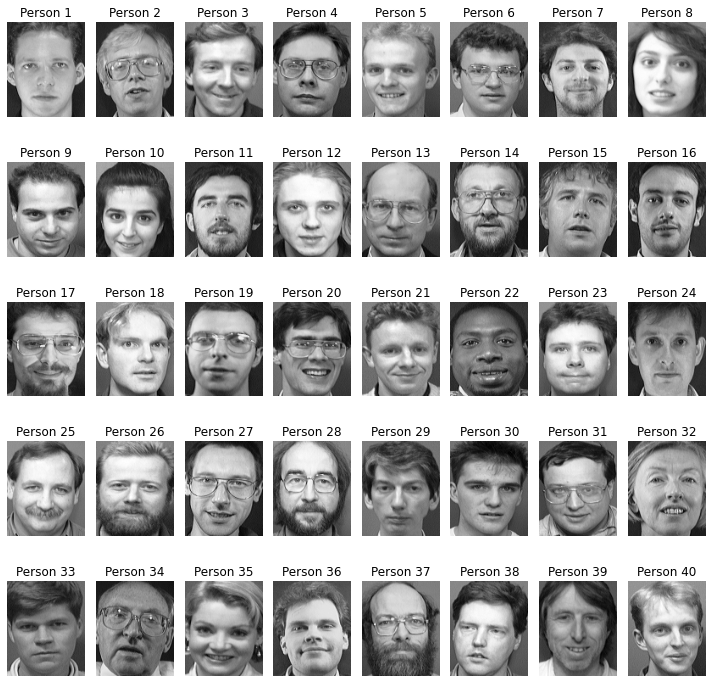

In [5]:
plt.figure(figsize=(10,10))

for person in range(datasetFaces.shape[0]):
    plt.subplot(5, 8, person+1)
    plt.imshow(datasetFaces[person][0], cmap='gray')
    plt.title('Person '+str(person+1))
    plt.axis('off')

plt.tight_layout()
plt.show()

### Processing

#### 1. Train and test data split

In [11]:
train_size = 0.6  # Split Data with random sampling

train_idx = np.random.choice(10, int(train_size*10), replace=False)
test_idx =  np.array(list(set(range(10)) - set(train_idx)))

train = []
test = []
for person in range(datasetFaces.shape[0]):
    for poses in range(datasetFaces.shape[1]):
        if poses in train_idx:
            train.append(datasetFaces[person][poses].flatten())
        else:
            test.append(datasetFaces[person][poses].flatten())
            
train = np.array(train)
test = np.array(test)

print('Train Data Index:', train_idx)
print('Test Data Index:', test_idx)
print('Train size:', train.shape)
print('Test size:', test.shape)

Train Data Index: [8 6 7 3 2 0]
Test Data Index: [1 4 5 9]
Train size: (240, 10304)
Test size: (160, 10304)


##### Train Data

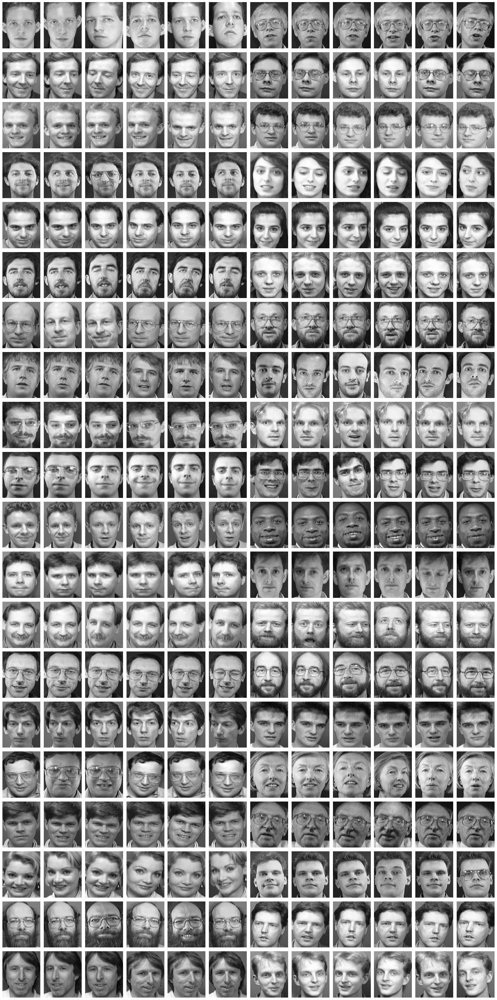

In [12]:
plt.figure(figsize=(20, 40))

# plot train data
for person in range(train.shape[0]):
    plt.subplot(20, 12, person + 1)  # Adjusted to 20 rows and 12 columns
    plt.imshow(train[person].reshape(112, 92), cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()


##### Test Data

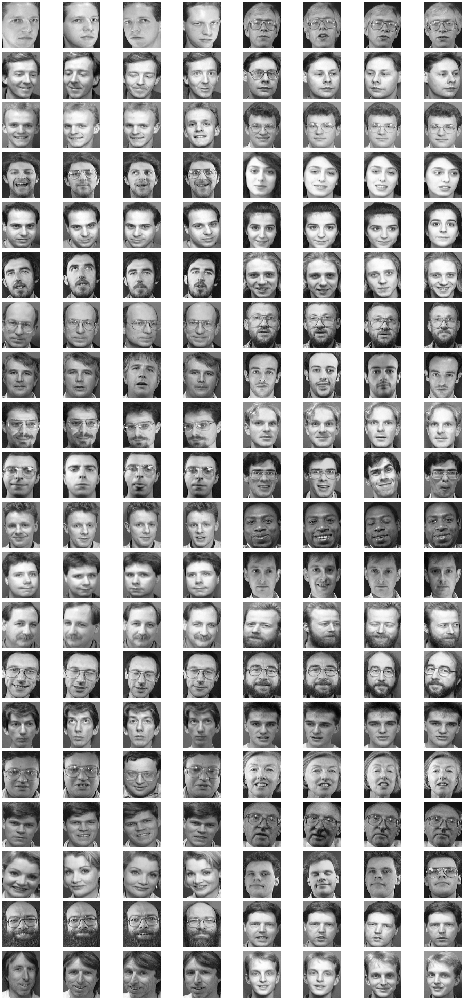

In [13]:
plt.figure(figsize=(20, 40))

# plot test data
for person in range(test.shape[0]):
    plt.subplot(20, 8, person + 1)  # Adjusted to 20 rows and 12 columns
    plt.imshow(test[person].reshape(112, 92), cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

#### Substracting the mean

In [20]:
meanTrain = np.mean(train, axis=0)

meanGandaTrain = np.zeros(train.shape)
meanGandaTrain[:, :] = meanTrain

zeroMeanTrain = train - meanGandaTrain

dfZeroMeanTrain = pd.DataFrame(zeroMeanTrain)
dfZeroMeanTrain

,0,1,2,3,4,5,6,7,8,9,...,10294,10295,10296,10297,10298,10299,10300,10301,10302,10303
0,-37.766667,-36.695833,-41.25,-38.9625,-37.279167,-29.183333,-47.3375,-44.2125,-33.225,-37.441667,...,-44.770833,-39.275,-40.395833,-39.508333,-29.958333,-34.3875,-32.895833,-30.25,-30.7875,-29.55
1,-46.766667,-41.695833,-33.25,-48.9625,-25.279167,-38.183333,-25.3375,-41.2125,-51.225,-46.441667,...,-60.770833,-53.275,-44.395833,-48.508333,-50.958333,-44.3875,-45.895833,-48.25,-50.7875,-46.55
2,-22.766667,-32.695833,-51.25,-49.9625,-53.279167,-52.183333,-55.3375,-51.2125,-47.225,-43.441667,...,89.229167,85.725,85.604167,80.491667,79.041667,92.6125,60.104167,-36.25,-66.7875,-51.55
3,-44.766667,-38.695833,-39.25,-39.9625,-42.279167,-37.183333,-38.3375,-28.2125,-25.225,-37.441667,...,-56.770833,-49.275,-45.395833,-46.508333,-42.958333,-42.3875,-37.895833,-42.25,-39.7875,-37.55
4,-41.766667,-42.695833,-54.25,-53.9625,-56.279167,-56.183333,-48.3375,-46.2125,-38.225,-20.441667,...,-46.770833,-41.275,-38.395833,-40.508333,-45.958333,-47.3875,-39.895833,-34.25,-33.7875,-38.55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,45.233333,39.304167,39.75,45.0375,38.720833,42.816667,38.6625,40.7875,40.775,40.558333,...,7.229167,5.725,9.604167,9.491667,14.041667,11.6125,16.104167,11.75,16.2125,15.45
236,44.233333,37.304167,40.75,39.0375,39.720833,39.816667,40.6625,38.7875,38.775,40.558333,...,-44.770833,-49.275,-47.395833,-43.508333,-44.958333,-38.3875,-35.895833,-44.25,-39.7875,-35.55
237,43.233333,41.304167,46.75,38.0375,44.720833,42.816667,43.6625,42.7875,40.775,45.558333,...,7.229167,8.725,12.604167,9.491667,11.041667,15.6125,12.104167,15.75,16.2125,17.45
238,39.233333,33.304167,37.75,39.0375,37.720833,34.816667,36.6625,38.7875,36.775,36.558333,...,-43.770833,-49.275,-42.395833,-43.508333,-46.958333,-35.3875,-36.895833,-41.25,-37.7875,-35.55
